- UNet을 구현하여 KITTI Dataset에서 road를 sementic segmentation한다.
- UNet++ 을 구현하여 KITTI Dataset에서 road를 sementic segmentation한다.
- 두 모델의 성능을 비교한다.

# Config setup

In [117]:
# 기본 백본으로는 vgg 사용

class setup_config():
    optimizer = "Adam"
    lr = 1e-4
    GPU_COUNT = 1
    nb_epoch = 100
    patience = 20
    deep_supervision = False
    
    def __init__(self, model="", 
                 backbone="",
                 init="",
                 data_augmentation=True,
                 input_rows=256, 
                 input_cols=256,
                 input_deps=3,
                 batch_size=8,
                 verbose=1,
                 decoder_block_type=None,
                 nb_class=None,
                 DATA_DIR = 'data/training',
                ):
        self.model = model
        self.backbone = backbone
        self.init = init
        self.exp_name = model + "-" + backbone + "-" + init
        self.data_augmentation = data_augmentation
        self.input_rows, self.input_cols = input_rows, input_cols
        self.input_deps = input_deps
        self.batch_size = batch_size
        self.verbose = verbose
        self.decoder_block_type = decoder_block_type
        self.nb_class = nb_class
        self.DATA_DIR = DATA_DIR
        if nb_class > 1:
            self.activation = "softmax"
        else:
            self.activation = "sigmoid"
        if self.init != "finetune":
            self.weights = None
        else:
            self.weights = "imagenet"
            
    def display(self):
        print("\nConfigurations:")
        sections = {
            "Model Info": ["model", "backbone", "init", "weights", "exp_name", "activation","decoder_block_type"],
            "Input Config": ["input_rows", "input_cols", "input_deps", "nb_class"],
            "Training Params": ["optimizer", "lr", "batch_size", "nb_epoch", "patience", "deep_supervision", "data_augmentation"],
            "Data & Runtime": ["DATA_DIR", "GPU_COUNT", "verbose"]
        }

        for section, keys in sections.items():
            print(section + ":")
            for key in keys:
                value = str(getattr(self, key)) 
                print(f"{key:<20}{value:<20}")
            print("")

# Build Model: BackBone

인코더로 사용할 백본 모델을 만들어야 한다.
- get backbone
- freeze/trainable model

In [2]:
from tensorflow.keras.applications import VGG16, VGG19

backbones = {
    "vgg16": VGG16,
    "vgg19": VGG19,
}

def get_backbone(name, *args, **kwargs):
    return backbones[name](*args, **kwargs)

def freeze_model(model):
    for layer in model.layers:
        layer.trainable = False
    return

def recompile(model):
    model.compile(model.optimizer, model.loss, model.metrics) 

def set_trainable(model):
    for layer in model.layers:
        layer.trainable = True
    recompile(model)

def get_layer_number(model, layer_name):
    """
    Help find layer in Keras model by name
    Args:
        model: Keras `Model`
        layer_name: str, name of layer

    Returns:
        index of layer

    Raises:
        ValueError: if model does not contains layer with such name
    """
    for i, l in enumerate(model.layers):
        if l.name == layer_name:
            return i
    raise ValueError('No layer with name {} in  model {}.'.format(layer_name, model._name))


def extract_outputs(model, layers, include_top=False):
    """
    Help extract intermediate layer outputs from model
    Args:
        model: Keras `Model`
        layer: list of integers/str, list of layers indexes or names to extract output
        include_top: bool, include final model layer output

    Returns:
        list of tensors (outputs)
    """
    layers_indexes = ([get_layer_number(model, l) if isinstance(l, str) else l
                      for l in layers])
    outputs = [model.layers[i].output for i in layers_indexes]

    if include_top:
        outputs.insert(0, model.output)

    return outputs


# Build Model: UNet

레이어 구현
- 기본 conv+Relu
- transpose/upsampling 두가지 방식

In [3]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, UpSampling2D, MaxPooling2D, Conv2DTranspose, concatenate
from tensorflow.keras.models import Model
# handle Block name 
# 깃허브를 참고. 앞으로도 이런식으로 모델 레이어 이름관리하면 좋을 것 같다.
def handle_unet_block_names(stage):
    conv_name = 'decoder_stage{}_conv'.format(stage)
    bn_name = 'decoder_stage{}_bn'.format(stage)
    relu_name = 'decoder_stage{}_relu'.format(stage)
    up_name = 'decoder_stage{}_upsample'.format(stage)
    return conv_name, bn_name, relu_name, up_name

# Convolution+Relu 
def ConvRelu_unet(filters, kernel_size, use_batchnorm=False, conv_name='conv', bn_name='bn', relu_name='relu'):
    def layer(x):
        x = Conv2D(filters, kernel_size, padding="same", name=conv_name, use_bias=not(use_batchnorm))(x)
        if use_batchnorm:
            x = BatchNormalization(name=bn_name)(x)
        x = Activation('relu', name=relu_name)(x)
        return x
    return layer


# Upsampling Block
def Upsample2D_unet_block(filters, stage, kernel_size=(3,3), upsample_rate=(2,2),
                     use_batchnorm=False, skip=None):

    def layer(input_tensor):

        conv_name, bn_name, relu_name, up_name = handle_unet_block_names(stage)

        x = UpSampling2D(size=upsample_rate, name=up_name)(input_tensor)

        # skip connection  
        if skip is not None:
            x = Concatenate()([x, skip])

        # Conv+Relu
        x = ConvRelu_unet(filters, kernel_size, use_batchnorm=use_batchnorm,
                     conv_name=conv_name + '1', bn_name=bn_name + '1', relu_name=relu_name + '1')(x)
        x = ConvRelu_unet(filters, kernel_size, use_batchnorm=use_batchnorm,
                     conv_name=conv_name + '2', bn_name=bn_name + '2', relu_name=relu_name + '2')(x)

        return x
    return layer

# Transpose Conv Block
def Transpose2D_unet_block(filters, stage, kernel_size=(3,3), upsample_rate=(2,2),
                      transpose_kernel_size=(4,4), use_batchnorm=False, skip=None):

    def layer(input_tensor):

        conv_name, bn_name, relu_name, up_name = handle_unet_block_names(stage)

        x = Conv2DTranspose(filters, transpose_kernel_size, strides=upsample_rate,
                            padding='same', name=up_name, use_bias=not(use_batchnorm))(input_tensor)
        if use_batchnorm:
            x = BatchNormalization(name=bn_name+'1')(x)
        x = Activation('relu', name=relu_name+'1')(x)

        if skip is not None:
            x = Concatenate()([x, skip])

        x = ConvRelu_unet(filters, kernel_size, use_batchnorm=use_batchnorm,
                     conv_name=conv_name + '2', bn_name=bn_name + '2', relu_name=relu_name + '2')(x)

        return x
    return layer

unet 디코더 부분 빌드

In [32]:
def build_unet(backbone, classes, skip_connection_layers,
               decoder_filters=(256,128,64,32,16),
               upsample_rates=(2,2,2,2,2),
               n_upsample_blocks=5,
               block_type='upsampling',
               activation='sigmoid',
               use_batchnorm=True):

    input = backbone.input
    x = backbone.output

    if block_type == 'transpose':
        up_block = Transpose2D_unet_block
    else:
        up_block = Upsample2D_unet_block

    # convert layer names to indices
    skip_connection_idx = ([get_layer_number(backbone, l) if isinstance(l, str) else l
                               for l in skip_connection_layers])

    for i in range(n_upsample_blocks):

        # check if there is a skip connection
        skip_connection = None
        if i < len(skip_connection_idx):
            skip_connection = backbone.layers[skip_connection_idx[i]].output

        upsample_rate = (upsample_rates[i], upsample_rates[i]) if np.isscalar(upsample_rates[i]) else upsample_rates[i]

        x = up_block(decoder_filters[i], i, upsample_rate=upsample_rate,
                         skip=skip_connection, use_batchnorm=use_batchnorm)(x)
    x = Conv2D(classes, (1,1), padding='same', name='final_conv', activation=activation)(x)

    model = Model(input, x)

    return model

인코더까지 포함하여 전체 모델 구성 함수

In [5]:
DEFAULT_SKIP_CONNECTIONS = {
    'vgg16':            ('block5_conv3', 'block4_conv3', 'block3_conv3', 'block2_conv2', 'block1_conv2'),
    'vgg19':            ('block5_conv4', 'block4_conv4', 'block3_conv4', 'block2_conv2', 'block1_conv2'),
}


def Unet(backbone_name='vgg16',
         input_shape=(None, None, 3),
         input_tensor=None,
         encoder_weights='imagenet',
         freeze_encoder=False,
         skip_connections='default',
         decoder_block_type='upsampling',
         decoder_filters=(256,128,64,32,16),
         decoder_use_batchnorm=True,
         n_upsample_blocks=5,
         upsample_rates=(2,2,2,2,2),
         classes=1,
         activation='sigmoid'):
    """

    Args:
        backbone_name: (str) look at list of available backbones.
        input_shape:  (tuple) dimensions of input data (H, W, C)
        input_tensor: keras tensor
        encoder_weights: one of `None` (random initialization), 
            'imagenet' (pre-training on ImageNet), 
            'dof' (pre-training on DoF)
        freeze_encoder: (bool) Set encoder layers weights as non-trainable. Useful for fine-tuning
        skip_connections: if 'default' is used take default skip connections,
            else provide a list of layer numbers or names starting from top of model
        decoder_block_type: (str) one of 'upsampling' and 'transpose' (look at blocks.py)
        decoder_filters: (int) number of convolution layer filters in decoder blocks
        decoder_use_batchnorm: (bool) if True add batch normalisation layer between `Conv2D` ad `Activation` layers
        n_upsample_blocks: (int) a number of upsampling blocks
        upsample_rates: (tuple of int) upsampling rates decoder blocks
        classes: (int) a number of classes for output
        activation: (str) one of keras activations for last model layer

    Returns:
        keras.models.Model instance

    """

    backbone = get_backbone(backbone_name,
                            input_shape=input_shape,
                            input_tensor=input_tensor,
                            weights=encoder_weights,
                            include_top=False)

    if skip_connections == 'default':
        skip_connections = DEFAULT_SKIP_CONNECTIONS[backbone_name]

    model = build_unet(backbone,
                       classes,
                       skip_connections,
                       decoder_filters=decoder_filters,
                       block_type=decoder_block_type,
                       activation=activation,
                       n_upsample_blocks=n_upsample_blocks,
                       upsample_rates=upsample_rates,
                       use_batchnorm=decoder_use_batchnorm)

    if freeze_encoder:
        freeze_model(backbone)

    model._name = 'u-{}'.format(backbone_name)

    return model

# Build Model: UNet++ (XNet)

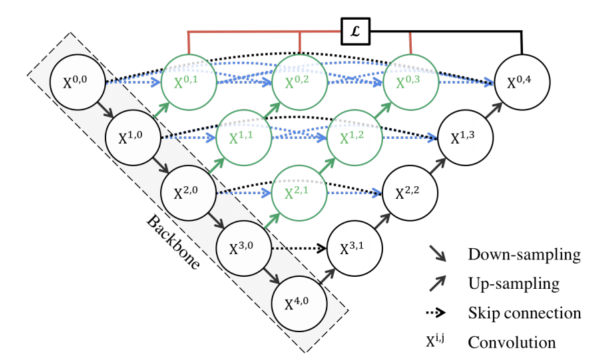

레이어 구현
- 기본 conv+Relu
- transpose/upsampling 두가지 방식

In [67]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, UpSampling2D, MaxPooling2D, Conv2DTranspose, concatenate
from tensorflow.keras.models import Model

# handle Block name 
def handle_xnet_block_names(stage, cols):
    conv_name = 'decoder_stage{}-{}_conv'.format(stage, cols)
    bn_name = 'decoder_stage{}-{}_bn'.format(stage, cols)
    relu_name = 'decoder_stage{}-{}_relu'.format(stage, cols)
    up_name = 'decoder_stage{}-{}_upsample'.format(stage, cols)
    merge_name = 'merge_{}-{}'.format(stage, cols)
    return conv_name, bn_name, relu_name, up_name, merge_name


# Convolution+Relu 
def ConvRelu_xnet(filters, kernel_size, use_batchnorm=False, conv_name='conv', bn_name='bn', relu_name='relu'):
    def layer(x):
        x = Conv2D(filters, kernel_size, padding="same", name=conv_name, use_bias=not(use_batchnorm))(x)
        if use_batchnorm:
            x = BatchNormalization(name=bn_name)(x)
        x = Activation('relu', name=relu_name)(x)
        return x
    return layer


# Upsampling Block
def Upsample2D_xnet_block(filters, stage, cols, kernel_size=(3,3), upsample_rate=(2,2),
                     use_batchnorm=False, skip=None):

    # 레이어를 만든다.
    def layer(input_tensor):
        
        #이름 설정
        conv_name, bn_name, relu_name, up_name, merge_name = handle_xnet_block_names(stage, cols)
        
        # 블록 생성
        x = UpSampling2D(size=upsample_rate, name=up_name)(input_tensor)

        # skip connection 
        if (type(skip) != list and skip is not None) or (type(skip) == list and None not in skip):
            if type(skip) is list:
                x = Concatenate(name=merge_name)([x] + skip)
            else:
                x = Concatenate(name=merge_name)([x, skip])

        # Conv+Relu
        x = ConvRelu_xnet(filters, kernel_size, use_batchnorm=use_batchnorm,
                     conv_name=conv_name + '1', bn_name=bn_name + '1', relu_name=relu_name + '1')(x)
        x = ConvRelu_xnet(filters, kernel_size, use_batchnorm=use_batchnorm,
                     conv_name=conv_name + '2', bn_name=bn_name + '2', relu_name=relu_name + '2')(x)

        return x
    return layer

# Transpose Conv Block
def Transpose2D_xnet_block(filters, stage, cols, kernel_size=(3,3), upsample_rate=(2,2),
                      transpose_kernel_size=(4,4), use_batchnorm=False, skip=None):

    def layer(input_tensor):

        conv_name, bn_name, relu_name, up_name, merge_name = handle_xnet_block_names(stage, cols)

        x = Conv2DTranspose(filters, transpose_kernel_size, strides=upsample_rate,
                            padding='same', name=up_name, use_bias=not(use_batchnorm))(input_tensor)
        if use_batchnorm:
            x = BatchNormalization(name=bn_name+'1')(x)
        x = Activation('relu', name=relu_name+'1')(x)

        if (type(skip) != list and skip is not None) or (type(skip) == list and None not in skip):
            # print("\nskip = {}".format(skip))
            if type(skip) is list:
                merge_list = []
                merge_list.append(x)
                for l in skip:
                    merge_list.append(l)
                x = Concatenate(name=merge_name)(merge_list)
            else:
                x = Concatenate(name=merge_name)([x, skip])

        x = ConvRelu_xnet(filters, kernel_size, use_batchnorm=use_batchnorm,
                     conv_name=conv_name + '2', bn_name=bn_name + '2', relu_name=relu_name + '2')(x)

        return x
    return layer

백본에 연결하는 UNet++ 모델 빌드부분

In [64]:
def build_xnet(
    backbone, # 인코더 백본 설정
    classes, # 클래스 수
    skip_connection_layers, 

    decoder_filters=(256,128,64,32,16),
    upsample_rates=(2,2,2,2,2),
    n_upsample_blocks=5,
    block_type='upsampling',
    activation='sigmoid',
    use_batchnorm=True):

    # 백본모델에서 입력층 가져옴
    input = backbone.input
    
    # 업샘플링 방식 선택 transpose conv 또는 upsampling + conv

    if block_type == 'transpose':
        up_block = Transpose2D_xnet_block
    else: 
        up_block = Upsample2D_xnet_block

    # skip connection layer가 업샘플 블록 수보다 많을 경우 절반 나누기
    if len(skip_connection_layers) > n_upsample_blocks:
        # 앞쪽 절반은 skipconnection, 뒤쪽 절반은 downsampling용으로 사용
        downsampling_layers = skip_connection_layers[int(len(skip_connection_layers)/2):]
        skip_connection_layers = skip_connection_layers[:int(len(skip_connection_layers)/2)]
    else:
        downsampling_layers = skip_connection_layers
    
    # skip connection 인덱스 변환 (이름 > 인덱스 or 그대로 인덱스)
    skip_connection_idx = ([get_layer_number(backbone, l) if isinstance(l, str) else l
                               for l in skip_connection_layers])
    # 백본에서 skipconnection할 레이어 받아옴
    skip_layers_list = [backbone.layers[skip_connection_idx[i]].output for i in range(len(skip_connection_idx))]
    
    # down sampling 인덱스 변환
    downsampling_idx = ([get_layer_number(backbone, l) if isinstance(l, str) else l
                               for l in downsampling_layers])
    # 백본에서 다운샘플링 할 레이어 받아옴
    downsampling_list = [backbone.layers[downsampling_idx[i]].output for i in range(len(downsampling_idx))]
    
    # 각 디코더 블록에 들어갈 인코더 출력 저장
    downterm = [None] * (n_upsample_blocks+1)
    for i in range(len(downsampling_idx)):
        if downsampling_list[0].name == backbone.output.name:
            downterm[n_upsample_blocks-i] = downsampling_list[i]
        else:
            downterm[n_upsample_blocks-i-1] = downsampling_list[i]
    
    # 마지막 출력은 항상 백본의 최종 output으로 설정
    downterm[-1] = backbone.output
    # 중간 결과(intermediate feature maps) 저장용 리스트 초기화
    interm = [None] * (n_upsample_blocks+1) * (n_upsample_blocks+1)
    
    # skip connection 레이어의 출력 배치하자
    for i in range(len(skip_connection_idx)):
        # 대각선방향...
        interm[-i*(n_upsample_blocks+1)+(n_upsample_blocks+1)*(n_upsample_blocks-1)] = skip_layers_list[i]
    
    # 마지막에 백본 아웃풋 배치
    interm[(n_upsample_blocks+1)*n_upsample_blocks] = backbone.output

    # 이제 업샘플링
    for j in range(n_upsample_blocks):
        for i in range(n_upsample_blocks-j):
            upsample_rate = (upsample_rates[i], upsample_rates[i]) if np.isscalar(upsample_rates[i]) else upsample_rates[i]

            
            # 스킵 연결이 적은 경우 빈 칸 유지
            if i == 0 and j < n_upsample_blocks-1 and len(skip_connection_layers) < n_upsample_blocks:
                interm[(n_upsample_blocks+1)*i+j+1] = None
                
            # 첫 열일 경우: downterm을 입력으로 사용 (스킵 없이)
            elif j == 0:
                if downterm[i+1] is not None:
                    interm[(n_upsample_blocks+1)*i+j+1] = up_block(decoder_filters[n_upsample_blocks-i-2], 
                                      i+1, j+1, upsample_rate=upsample_rate,
                                      skip=interm[(n_upsample_blocks+1)*i+j], 
                                      use_batchnorm=use_batchnorm)(downterm[i+1])
                else:
                    interm[(n_upsample_blocks+1)*i+j+1] = None
                    
            # 그 외의 경우
            # 이전 행의 출력을 입력으로 사용하고 skip은 현재 행의 이전 열들로 구성된 리스트
            else:
                interm[(n_upsample_blocks+1)*i+j+1] = up_block(decoder_filters[n_upsample_blocks-i-2], 
                                  i+1, j+1, upsample_rate=upsample_rate,
                                  skip=interm[(n_upsample_blocks+1)*i : (n_upsample_blocks+1)*i+j+1], 
                                  use_batchnorm=use_batchnorm)(interm[(n_upsample_blocks+1)*(i+1)+j])

    # 마지막 convolution layer로 채널 수 조정 및 활성화 함수 적용
    x = Conv2D(classes, (1,1), padding='same', name='final_conv', activation=activation)(interm[n_upsample_blocks])

    model = Model(input, x)

    return model

인코더까지 포함하여 전체 모델 구성 함수

In [8]:
DEFAULT_SKIP_CONNECTIONS = {
    'vgg16':            ('block5_conv3', 'block4_conv3', 'block3_conv3', 'block2_conv2', 'block1_conv2',
                         'block5_pool', 'block4_pool', 'block3_pool', 'block2_pool', 'block1_pool',
                        ),
    'vgg19':            ('block5_conv4', 'block4_conv4', 'block3_conv4', 'block2_conv2', 'block1_conv2',
                         'block5_pool', 'block4_pool', 'block3_pool', 'block2_pool', 'block1_pool',
                        ),
}


def Xnet(backbone_name='vgg16',
         input_shape=(None, None, 3),
         input_tensor=None,
         encoder_weights='imagenet',
         freeze_encoder=False,
         skip_connections='default',
         decoder_block_type='upsampling',
         decoder_filters=(256,128,64,32,16),
         decoder_use_batchnorm=True,
         n_upsample_blocks=5,
         upsample_rates=(2,2,2,2,2),
         classes=1,
         activation='sigmoid'):
    """

    Args:
        backbone_name: (str) look at list of available backbones.
        input_shape:  (tuple) dimensions of input data (H, W, C)
        input_tensor: keras tensor
        encoder_weights: one of `None` (random initialization), 
            'imagenet' (pre-training on ImageNet), 
            'dof' (pre-training on DoF)
        freeze_encoder: (bool) Set encoder layers weights as non-trainable. Useful for fine-tuning
        skip_connections: if 'default' is used take default skip connections,
            else provide a list of layer numbers or names starting from top of model
        decoder_block_type: (str) one of 'upsampling' and 'transpose' (look at blocks.py)
        decoder_filters: (int) number of convolution layer filters in decoder blocks
        decoder_use_batchnorm: (bool) if True add batch normalisation layer between `Conv2D` ad `Activation` layers
        n_upsample_blocks: (int) a number of upsampling blocks
        upsample_rates: (tuple of int) upsampling rates decoder blocks
        classes: (int) a number of classes for output
        activation: (str) one of keras activations for last model layer

    Returns:
        keras.models.Model instance

    """


    backbone = get_backbone(backbone_name,
                            input_shape=input_shape,
                            input_tensor=input_tensor,
                            weights=encoder_weights,
                            include_top=False)

    if skip_connections == 'default':
        skip_connections = DEFAULT_SKIP_CONNECTIONS[backbone_name]

    model = build_xnet(backbone,
                       classes,
                       skip_connections,
                       decoder_filters=decoder_filters,
                       block_type=decoder_block_type,
                       activation=activation,
                       n_upsample_blocks=n_upsample_blocks,
                       upsample_rates=upsample_rates,
                       use_batchnorm=decoder_use_batchnorm)

    if freeze_encoder:
        freeze_model(backbone)

    model._name = 'x-{}'.format(backbone_name)

    return model

# Helper Functions

- Loss Function 
- Evaluation Metrics


1. Loss: 두 버전의  U++Net에서의 내용 참고
|UNet++: A Nested U-Net Architecture for Medical Image Segmentation|UNet++: Redesigning Skip Connections to Exploit Multiscale Features in Image Segmentation|
|-|-|
|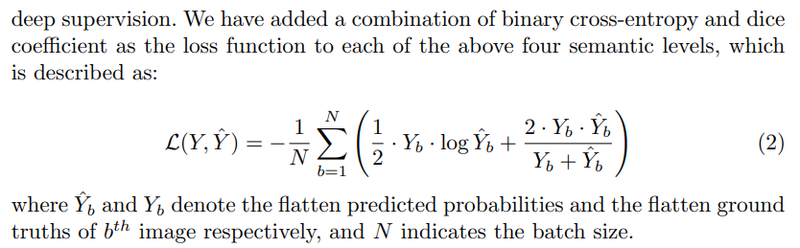 |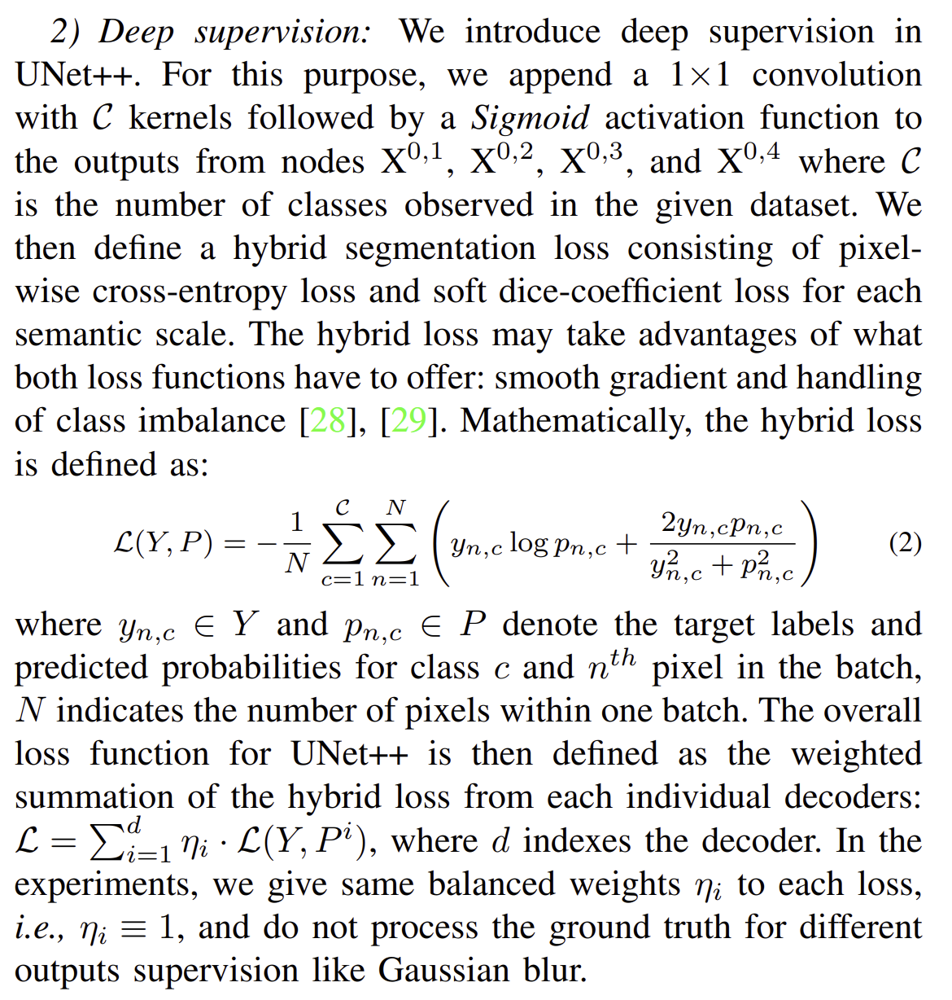|

In [143]:
import keras
from keras import backend as K

def binary_mean_iou(y_true, y_pred):
    y_pred = tf.cast(y_pred > 0.5, tf.float32)
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) - intersection
    return (intersection + 1e-7) / (union + 1e-7)

# dice coefficient 구하기
def dice_coef(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

# dice coefficient loss
def dice_coef_loss(y_true, y_pred):
    return 1. - dice_coef(y_true, y_pred)

# 
def bce_dice_loss(y_true, y_pred):
    return 0.5 * keras.losses.binary_crossentropy(y_true, y_pred) - dice_coef(y_true, y_pred)


2. Evaluate Metrics

- Dice
- IoU
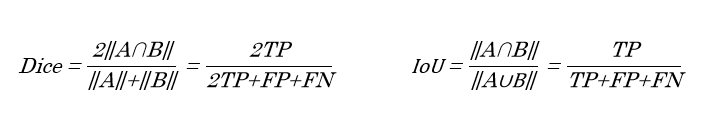

In [10]:
# Metric1: IoU
def compute_iou(im1, im2):
    overlap = (im1>0.5) * (im2>0.5)
    union = (im1>0.5) + (im2>0.5)
    return overlap.sum()/float(union.sum())


# Metric2: Dice
def compute_dice(im1, im2, empty_score=1.0):
    im1 = np.asarray(im1>0.5).astype(np.bool)
    im2 = np.asarray(im2>0.5).astype(np.bool)

    if im1.shape != im2.shape:
        raise ValueError("Shape mismatch: im1 and im2 must have the same shape.")

    im_sum = im1.sum() + im2.sum()
    if im_sum == 0:
        return empty_score

    intersection = np.logical_and(im1, im2)

    return 2. * intersection.sum() / im_sum

# Dataset Generator

In [11]:
import os
import math
import numpy as np
import tensorflow as tf

from PIL import Image
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
from glob import glob

from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from albumentations import  HorizontalFlip, RandomSizedCrop, Compose, OneOf, Resize

def build_augmentation(is_train=True, image_rows=224, image_cols =224):
    if is_train:    # 훈련용 데이터일 경우
        return Compose([
                        HorizontalFlip(p=0.5),    # 50%의 확률로 좌우대칭
                        RandomSizedCrop(         # 50%의 확률로 RandomSizedCrop
                            min_max_height=(300, 370),
                            w2h_ratio=370/1242,
                            height=image_rows,
                            width=image_cols,
                            p=0.5
                            ),
                        Resize(              # 입력이미지를 224X224로 resize
                            width=224,
                            height=224
                            )
                        ])
    return Compose([      # 테스트용 데이터일 경우에는 224X224로 resize만 수행합니다. 
            Resize(height=image_rows, width=image_cols)
                ])

class KittiGenerator(tf.keras.utils.Sequence):
    '''
    KittiGenerator는 tf.keras.utils.Sequence를 상속받습니다.
    우리가 KittiDataset을 원하는 방식으로 preprocess하기 위해서 Sequnce를 커스텀해 사용합니다.
    '''
    def __init__(
        self, 
        dir_path,
        batch_size=16,
        img_size=(224, 224, 3),
        output_size=(224, 224),
        is_train=False,
        is_val = False,
        augmentation=None):
        '''
        dir_path: dataset의 directory path입니다.
        batch_size: batch_size입니다.
        img_size: preprocess에 사용할 입력이미지의 크기입니다.
        output_size: ground_truth를 만들어주기 위한 크기입니다.
        is_train: 이 Generator가 학습용인지 테스트용인지 구분합니다.
        augmentation: 적용하길 원하는 augmentation 함수를 인자로 받습니다.
        '''
        self.dir_path = dir_path
        self.batch_size = batch_size
        self.is_train = is_train
        self.is_val = is_val
        self.dir_path = dir_path
        self.augmentation = augmentation
        self.img_size = img_size
        self.output_size = output_size

        # load_dataset()을 통해서 kitti dataset의 directory path에서 라벨과 이미지를 확인합니다.
        self.data = self.load_dataset()

    def load_dataset(self):
        # kitti dataset에서 필요한 정보(이미지 경로 및 라벨)를 directory에서 확인하고 로드하는 함수입니다.
        # 이때 is_train에 따라 test set을 분리해서 load하도록 해야합니다.
        input_images = glob(os.path.join(self.dir_path, "image_2", "*.png"))
        label_images = glob(os.path.join(self.dir_path, "semantic", "*.png"))
        input_images.sort()
        label_images.sort()
        assert len(input_images) == len(label_images)
        data = [ _ for _ in zip(input_images, label_images)]

        if self.is_train:
            return data[:-60]
        
        if self.is_val:
            return data[-60:-30]
        
        return data[-30:]

    def __len__(self):
    # Generator의 length로서 전체 dataset을 batch_size로 나누고 소숫점 첫째자리에서 올림한 값을 반환합니다.
        return math.ceil(len(self.data) / self.batch_size)

    def __getitem__(self, index):
    # 입력과 출력을 만듭니다.
    # 입력은 resize및 augmentation이 적용된 input image이고 
    # 출력은 semantic label입니다.
        batch_data = self.data[
                               index*self.batch_size:
                               (index + 1)*self.batch_size
                               ]
        inputs = np.zeros([self.batch_size, *self.img_size])
        outputs = np.zeros([self.batch_size, *self.output_size])

        for i, data in enumerate(batch_data):
            input_img_path, output_path = data
            _input = imread(input_img_path)
            _output = imread(output_path)
            _output = (_output==7).astype(np.uint8)*1
            data = {
              "image": _input,
              "mask": _output,
              }
            augmented = self.augmentation(**data)
            inputs[i] = augmented["image"]/255
            outputs[i] = augmented["mask"]
        return inputs, outputs

        def on_epoch_end(self):
            # 한 epoch가 끝나면 실행되는 함수입니다. 학습중인 경우에 순서를 random shuffle하도록 적용한 것을 볼 수 있습니다.
            self.indexes = np.arange(len(self.data))
            if self.is_train == True :
                np.random.shuffle(self.indexes)
                return self.indexes

# Train

In [90]:
model_path =os.getenv('HOME')+'/aiffel/semantic_segmentation/model/'

## UNet

config 설정

In [138]:
config_dict = {
    "model": "Unet",
    "backbone": "vgg16",
    "init": "random",
    "data_augmentation": True,
    "input_rows": 128,
    "input_cols": 128,
    "input_deps": 3,
    "batch_size": 8,
    "verbose": 1,
    "decoder_block_type": "upsampling",
    "nb_class": 1,
    "DATA_DIR": "data/training",
}
config = setup_config(**config_dict)
config.display()


Configurations:
Model Info:
model               Unet                
backbone            vgg16               
init                random              
weights             None                
exp_name            Unet-vgg16-random   
activation          sigmoid             
decoder_block_type  upsampling          

Input Config:
input_rows          128                 
input_cols          128                 
input_deps          3                   
nb_class            1                   

Training Params:
optimizer           Adam                
lr                  0.0001              
batch_size          8                   
nb_epoch            100                 
patience            20                  
deep_supervision    False               
data_augmentation   True                

Data & Runtime:
DATA_DIR            data/training       
GPU_COUNT           1                   
verbose             1                   



데이터 준비

In [144]:
augmentation = build_augmentation(image_rows=config.input_rows, image_cols =config.input_cols)
test_preproc = build_augmentation(is_train=False)
        
train_generator = KittiGenerator(
    config.DATA_DIR, 
    augmentation=augmentation,
    is_train=True
)

val_generator = KittiGenerator(
    config.DATA_DIR, 
    augmentation=test_preproc,
    is_val=True
)

모델 준비

In [145]:
if config.model == "Unet":
    model = Unet(backbone_name=config.backbone,
                 encoder_weights=config.weights,
                 decoder_block_type=config.decoder_block_type,
                 classes=config.nb_class,
                 activation=config.activation)
elif config.model == "Xnet":
    model = Xnet(backbone_name=config.backbone,
                 encoder_weights=config.weights,
                 decoder_block_type=config.decoder_block_type,
                 classes=config.nb_class,
                 activation=config.activation)
else:
    raise

model.summary()

model.compile(optimizer="Adam", 
              loss= 'binary_crossentropy', 
              metrics=["binary_crossentropy",  binary_mean_iou, dice_coef])

Model: "u-vgg16"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_30 (InputLayer)           [(None, None, None,  0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, None, None, 6 1792        input_30[0][0]                   
__________________________________________________________________________________________________
block1_conv2 (Conv2D)           (None, None, None, 6 36928       block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_pool (MaxPooling2D)      (None, None, None, 6 0           block1_conv2[0][0]               
____________________________________________________________________________________________

학습

In [146]:
early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss', 
                                               patience=config.patience, 
                                               verbose=0,
                                               mode='min',
                                              )
check_point = keras.callbacks.ModelCheckpoint(os.path.join(model_path, config.exp_name+".h5"),
                                              monitor='val_loss', 
                                              verbose=1, 
                                              save_best_only=True, 
                                              mode='min',
                                             )
callbacks = [check_point, early_stopping]

history_v1 = model.fit(
    train_generator,
    batch_size=config.batch_size,
    epochs=config.nb_epoch,  
    verbose=config.verbose, 
    validation_data=val_generator,
    callbacks=callbacks)

Epoch 1/100
9/9 [==============================] - 11s 1s/step - loss: 0.6721 - binary_crossentropy: 0.6721 - binary_mean_iou: 0.3428 - dice_coef: 0.3790 - val_loss: 0.4852 - val_binary_crossentropy: 0.4852 - val_binary_mean_iou: 0.3861 - val_dice_coef: 0.4958

Epoch 00001: val_loss improved from inf to 0.48522, saving model to /aiffel/aiffel/semantic_segmentation/model/Unet-vgg16-random.h5
Epoch 2/100
9/9 [==============================] - 8s 854ms/step - loss: 0.5166 - binary_crossentropy: 0.5166 - binary_mean_iou: 0.4959 - dice_coef: 0.4481 - val_loss: 3.7946 - val_binary_crossentropy: 3.7946 - val_binary_mean_iou: 0.2002 - val_dice_coef: 0.2983

Epoch 00002: val_loss did not improve from 0.48522
Epoch 3/100
9/9 [==============================] - 8s 876ms/step - loss: 0.4584 - binary_crossentropy: 0.4584 - binary_mean_iou: 0.5396 - dice_coef: 0.4676 - val_loss: 0.6129 - val_binary_crossentropy: 0.6129 - val_binary_mean_iou: 0.0899 - val_dice_coef: 0.2710

Epoch 00003: val_loss did n

##  UNet++

config 설정, data준비

In [147]:
config_dict = {
    "model": "Xnet",
    "backbone": "vgg16",
    "init": "random",
    "data_augmentation": True,
    "input_rows": 128,
    "input_cols": 128,
    "input_deps": 3,
    "batch_size": 8, 
    "verbose": 1,
    "decoder_block_type": "upsampling",
    "nb_class": 1,
    "DATA_DIR": "data/training",
}
config = setup_config(**config_dict)

augmentation = build_augmentation(image_rows=config.input_rows, image_cols =config.input_cols)
test_preproc = build_augmentation(is_train=False)
        
train_generator = KittiGenerator(
    config.DATA_DIR, 
    augmentation=augmentation,
    is_train=True
)

val_generator = KittiGenerator(
    config.DATA_DIR, 
    augmentation=test_preproc,
    is_val=True
)

config.display()


Configurations:
Model Info:
model               Xnet                
backbone            vgg16               
init                random              
weights             None                
exp_name            Xnet-vgg16-random   
activation          sigmoid             
decoder_block_type  upsampling          

Input Config:
input_rows          128                 
input_cols          128                 
input_deps          3                   
nb_class            1                   

Training Params:
optimizer           Adam                
lr                  0.0001              
batch_size          8                   
nb_epoch            100                 
patience            20                  
deep_supervision    False               
data_augmentation   True                

Data & Runtime:
DATA_DIR            data/training       
GPU_COUNT           1                   
verbose             1                   



모델 준비

In [148]:
if config.model == "Unet":
    model = Unet(backbone_name=config.backbone,
                 encoder_weights=config.weights,
                 decoder_block_type=config.decoder_block_type,
                 classes=config.nb_class,
                 activation=config.activation)
elif config.model == "Xnet":
    model = Xnet(backbone_name=config.backbone,
                 encoder_weights=config.weights,
                 decoder_block_type=config.decoder_block_type,
                 classes=config.nb_class,
                 activation=config.activation)
else:
    raise

model.summary()

Model: "x-vgg16"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_31 (InputLayer)           [(None, None, None,  0                                            
__________________________________________________________________________________________________
block1_conv1 (Conv2D)           (None, None, None, 6 1792        input_31[0][0]                   
__________________________________________________________________________________________________
block1_conv2 (Conv2D)           (None, None, None, 6 36928       block1_conv1[0][0]               
__________________________________________________________________________________________________
block1_pool (MaxPooling2D)      (None, None, None, 6 0           block1_conv2[0][0]               
____________________________________________________________________________________________

학습

In [149]:
mean_IoU = tf.keras.metrics.MeanIoU(num_classes=2, name="mean_io_u")
model.compile(optimizer="Adam", 
              loss=bce_dice_loss, 
              metrics=["binary_crossentropy",binary_mean_iou, dice_coef])

early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss', 
                                               patience=config.patience, 
                                               verbose=0,
                                               mode='min',
                                              )
check_point = keras.callbacks.ModelCheckpoint(os.path.join(model_path, config.exp_name+".h5"),
                                              monitor='val_loss', 
                                              verbose=1, 
                                              save_best_only=True, 
                                              mode='min',
                                             )
callbacks = [check_point, early_stopping]

history_v2 = model.fit(
    train_generator,
    batch_size=config.batch_size,
    epochs=config.nb_epoch, 
    verbose=config.verbose, 
    validation_data=val_generator,
    callbacks=callbacks)

Epoch 1/100
9/9 [==============================] - 19s 2s/step - loss: -0.2518 - binary_crossentropy: 0.4788 - binary_mean_iou: 0.4303 - dice_coef: 0.4913 - val_loss: 1.4976 - val_binary_crossentropy: 2.9952 - val_binary_mean_iou: 6.7642e-13 - val_dice_coef: 3.2635e-05

Epoch 00001: val_loss improved from inf to 1.49758, saving model to /aiffel/aiffel/semantic_segmentation/model/Xnet-vgg16-random.h5
Epoch 2/100
9/9 [==============================] - 15s 2s/step - loss: -0.4220 - binary_crossentropy: 0.3689 - binary_mean_iou: 0.5452 - dice_coef: 0.6064 - val_loss: 1.4824 - val_binary_crossentropy: 2.9654 - val_binary_mean_iou: 6.6919e-13 - val_dice_coef: 3.2132e-04

Epoch 00002: val_loss improved from 1.49758 to 1.48236, saving model to /aiffel/aiffel/semantic_segmentation/model/Xnet-vgg16-random.h5
Epoch 3/100
9/9 [==============================] - 16s 2s/step - loss: -0.5119 - binary_crossentropy: 0.3040 - binary_mean_iou: 0.6046 - dice_coef: 0.6639 - val_loss: 1.1109 - val_binary_cro

In [150]:
import matplotlib.pyplot as plt
def plot_history(history):
    print("Available metrics:", history.history.keys())
    
    metrics_to_plot = [
        ('loss', 'Loss'),
        ('binary_crossentropy', 'Binary Crossentropy'),
        ('binary_mean_iou', 'Mean IoU'),
        ('dice_coef', 'Dice Coefficient')
    ]
    
    plt.figure(figsize=(16, 12))
    
    for i, (metric_key, metric_name) in enumerate(metrics_to_plot, 1):
        plt.subplot(2, 2, i)
        
        # train 값 그리기
        if metric_key in history.history:
            plt.plot(history.history[metric_key], label=f'train_{metric_key}')
        
        # val 값 그리기
        val_key = f'val_{metric_key}'
        if val_key in history.history:
            plt.plot(history.history[val_key], label=f'val_{metric_key}')
        
        plt.title(metric_name)
        plt.xlabel('Epoch')
        plt.ylabel(metric_name)
        plt.legend(loc='best')
        plt.grid()
    
    plt.tight_layout()
    plt.show()

Available metrics: dict_keys(['loss', 'binary_crossentropy', 'binary_mean_iou', 'dice_coef', 'val_loss', 'val_binary_crossentropy', 'val_binary_mean_iou', 'val_dice_coef'])


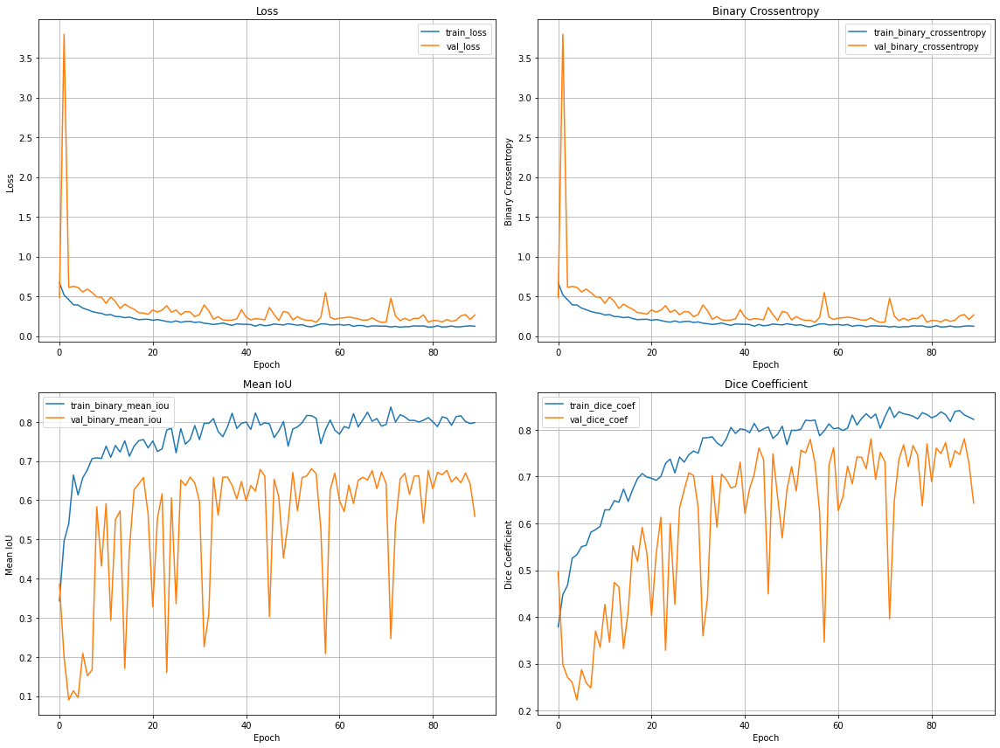

In [151]:
plot_history(history_v1)

Available metrics: dict_keys(['loss', 'binary_crossentropy', 'binary_mean_iou', 'dice_coef', 'val_loss', 'val_binary_crossentropy', 'val_binary_mean_iou', 'val_dice_coef'])


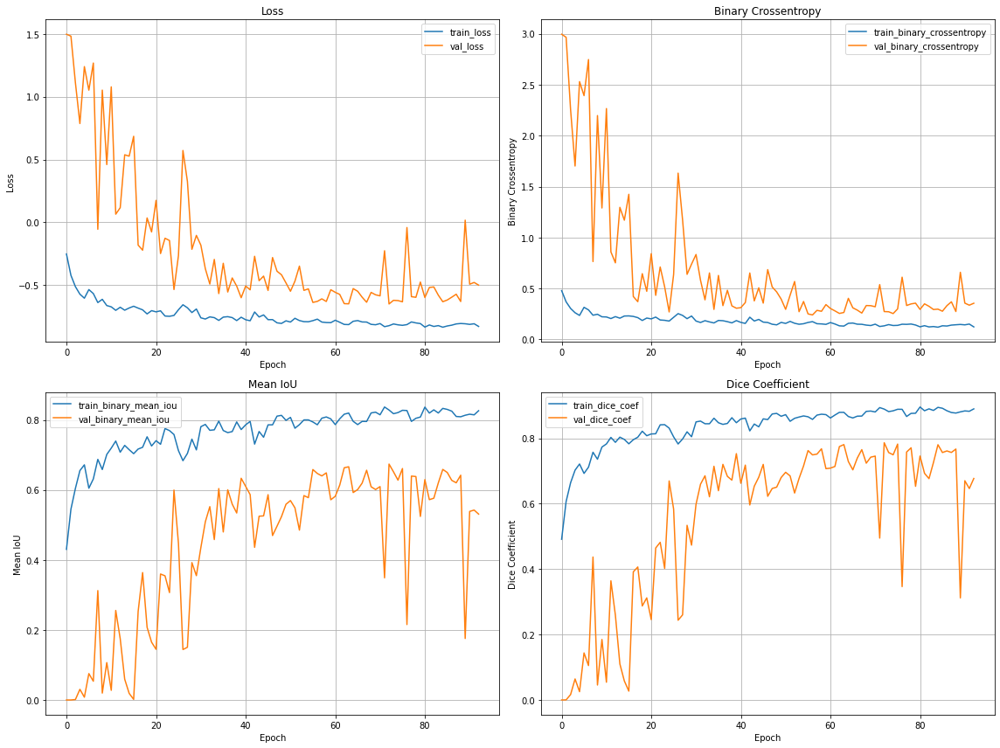

In [152]:
plot_history(history_v2)

# Evaluation

- mean IOU
- Dice

In [188]:
def compute_iou(im1, im2):
    im1 = (im1 > 0.5).astype(np.uint8)
    im2 = (im2 > 0.5).astype(np.uint8)
    intersection = np.logical_and(im1, im2).sum()
    union = np.logical_or(im1, im2).sum()
    if union == 0:
        return 1.0  # 둘 다 배경일 경우
    return intersection / union


def compute_dice(im1, im2, empty_score=1.0):
    im1 = (im1 > 0.5).astype(bool)
    im2 = (im2 > 0.5).astype(bool)
    if im1.shape != im2.shape:
        raise ValueError("Shape mismatch: im1 and im2 must have the same shape.")

    im_sum = im1.sum() + im2.sum()
    if im_sum == 0:
        return empty_score

    intersection = np.logical_and(im1, im2)
    return 2. * intersection.sum() / im_sum

def evaluate_metrics(y_true, y_pred, threshold=0.5):
    """
    y_true, y_pred: shape (batch, H, W) 또는 (batch, H, W, 1)
    threshold: 예측값을 이진화할 기준 (default: 0.5)
    """
    y_true = np.squeeze(y_true)
    y_pred = np.squeeze(y_pred)
    
    iou_scores = []
    dice_scores = []

    for gt, pred in zip(y_true, y_pred):
        iou = compute_iou(gt, pred)
        dice = compute_dice(gt, pred)
        iou_scores.append(iou)
        dice_scores.append(dice)

    mean_iou = np.mean(iou_scores)
    mean_dice = np.mean(dice_scores)

    var_iou = np.var(iou_scores)
    var_dice = np.var(dice_scores)

    std_iou = np.std(iou_scores)
    std_dice = np.std(dice_scores)
    
    return {
        "mean_iou": mean_iou,
        "var_iou": var_iou,
        "std_iou": std_iou,
        "mean_dice": mean_dice,
        "var_dice": var_dice,
        "std_dice": std_dice,
        "iou_scores": iou_scores,
        "dice_scores": dice_scores
    }

def plot_segmentation_boxplots(metric1, metric2, title='Comparison'):
    plt.figure(figsize=(8, 6))
    plt.boxplot([metric1, metric2], labels=['XNet', 'UNet'], patch_artist=True,
                boxprops=dict(facecolor='lightgreen', color='black'),
                medianprops=dict(color='red'),
                whiskerprops=dict(color='black'),
                capprops=dict(color='black'),
                flierprops=dict(marker='o', color='black', alpha=0.5))

    plt.title(title)
    plt.ylabel('Score')
    plt.ylim(0, 1)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.show()
    
from scipy.stats import ttest_rel
import numpy as np

def paired_t_test(metric1, metric2, alpha=0.05, metric_name="Metric"):
    metric1 = np.asarray(metric1)
    metric2 = np.asarray(metric2)
    
    assert metric1.shape == metric2.shape, "두 metric 리스트의 길이가 일치해야 합니다."

    t_stat, p_value = ttest_rel(metric1, metric2)
    
    print(f"Paired t-test for {metric_name}")
    print(f"T-statistic : {t_stat:.4f}")
    print(f"P-value     : {p_value:.4e}")

    if p_value < alpha:
        print(f"{metric_name} 차이는 통계적으로 유의미합니다 (p < {alpha})")
    else:
        print(f"{metric_name} 차이는 통계적으로 유의미하지 않습니다 (p ≥ {alpha})")

    return t_stat, p_value

def evaluate_model(model, test_generator, model_name="Model"):
    # 1. 예측 수행
    y_pred = model.predict(test_generator, batch_size=config.batch_size, verbose=config.verbose)
    
    # 2. GT (y_true) 수집
    y_true = []
    for i in range(len(test_generator)):
        _, y_batch = test_generator[i]
        y_true.append(y_batch)
    y_true = np.concatenate(y_true, axis=0)

    # 3. 메트릭 계산
    results = evaluate_metrics(y_true, y_pred)

    # 4. 요약 출력
    print(f"[{model_name}] Evaluation Results")
    print(f"Mean IoU   : {results['mean_iou']:.4f} ± {results['std_iou']:.4f}")
    print(f"Mean Dice  : {results['mean_dice']:.4f} ± {results['std_dice']:.4f}")
    print("")

    return results

In [189]:
# 테스트셋 준비
test_generator = KittiGenerator(
    config.DATA_DIR, 
    augmentation=test_preproc,
)

In [190]:
# 모델 로드
xnet_model = tf.keras.models.load_model(
    '/aiffel/aiffel/semantic_segmentation/model/Xnet-vgg16-random.h5' ,
    custom_objects={'bce_dice_loss': bce_dice_loss,'binary_mean_iou': binary_mean_iou, 'dice_coef': dice_coef, }
)
unet_model = tf.keras.models.load_model(
    '/aiffel/aiffel/semantic_segmentation/model/Unet-vgg16-random.h5' ,
    custom_objects={'bce_dice_loss': bce_dice_loss,'binary_mean_iou': binary_mean_iou, 'dice_coef': dice_coef, }
)

In [191]:
# test set inference
results_xnet = evaluate_model(xnet_model, test_generator, model_name="XNet")
results_unet = evaluate_model(unet_model, test_generator, model_name="UNet")

2/2 [==============================] - 2s 612ms/step
[XNet] Evaluation Results
Mean IoU   : 0.6917 ± 0.3162
Mean Dice  : 0.7599 ± 0.3132

2/2 [==============================] - 2s 586ms/step
[UNet] Evaluation Results
Mean IoU   : 0.6904 ± 0.3137
Mean Dice  : 0.7612 ± 0.3043



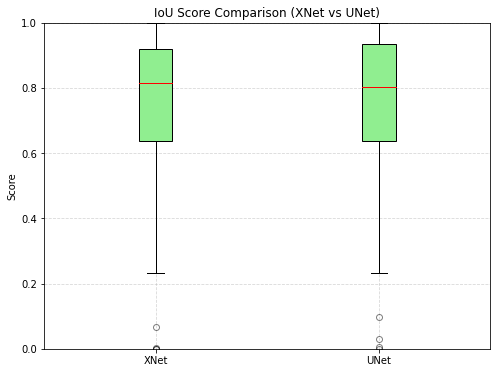

Paired t-test for IoU
T-statistic : 0.0790
P-value     : 9.3751e-01
IoU 차이는 통계적으로 유의미하지 않습니다 (p ≥ 0.05)


(0.07903355099525142, 0.9375139157064329)

In [192]:
plot_segmentation_boxplots(
    results_xnet['iou_scores'],
    results_unet['iou_scores'],
    title="IoU Score Comparison (XNet vs UNet)"
)
paired_t_test(results_xnet['iou_scores'], results_unet['iou_scores'], metric_name="IoU")

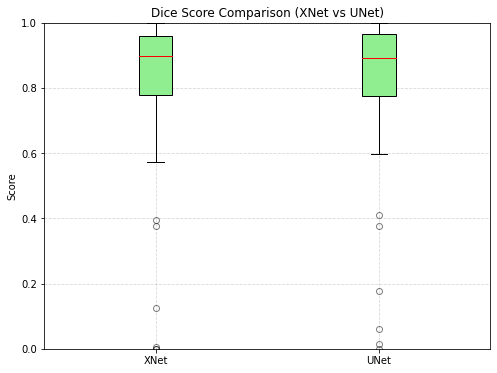

Paired t-test for Dice
  - T-statistic : -0.0795
  - P-value     : 9.3718e-01
Dice 차이는 통계적으로 유의미하지 않습니다 (p ≥ 0.05)


(-0.07945659097312446, 0.937180172666219)

In [183]:
plot_segmentation_boxplots(
    results_xnet['dice_scores'],
    results_unet['dice_scores'],
    title="Dice Score Comparison (XNet vs UNet)"
)
paired_t_test(results_xnet['dice_scores'], results_unet['dice_scores'], metric_name="Dice")

#  시각화

In [213]:

def get_output(model, preproc, image_path, output_path, label_path):
    origin_img = imread(image_path)
    data = {"image":origin_img}
    processed = preproc(**data)
    output = model(np.expand_dims(processed["image"]/255,axis=0))
    output = (output[0].numpy()>=0.5).astype(np.uint8).squeeze(-1)*255 
    prediction = output/255   # 도로로 판단한 영역
    
    output = Image.fromarray(output)
    background = Image.fromarray(origin_img).convert('RGBA')
    output = output.resize((origin_img.shape[1], origin_img.shape[0])).convert('RGBA')
    output = Image.blend(background, output, alpha=0.6)
    output.show()   # 도로로 판단한 영역을 시각화!
     
    if label_path:   
        label_img = imread(label_path)
        label_data = {"image":label_img}
        label_processed = preproc(**label_data)
        label_processed = label_processed["image"]
        target = (label_processed == 7).astype(np.uint8)*1
        
        return output, prediction, target
    else:
        return output, prediction, _

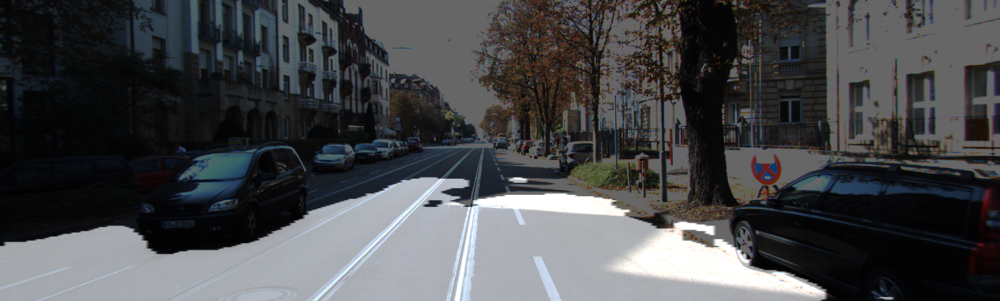

IoU: 0.8194
Dice:0.9007


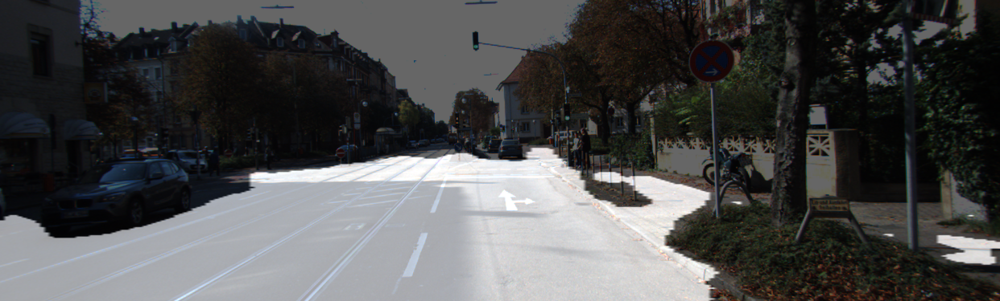

IoU: 0.8689
Dice:0.9298


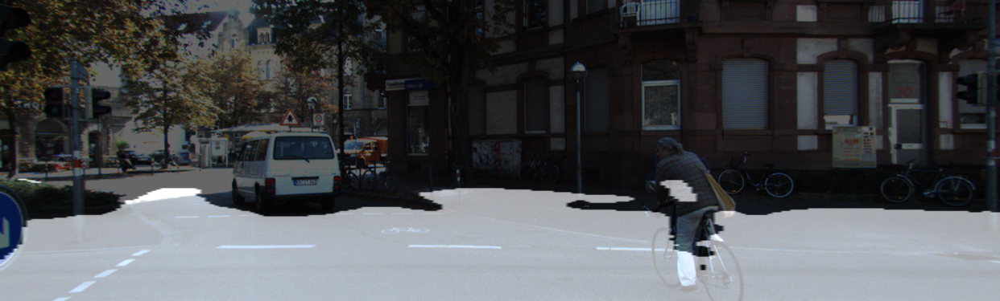

IoU: 0.6419
Dice:0.7819


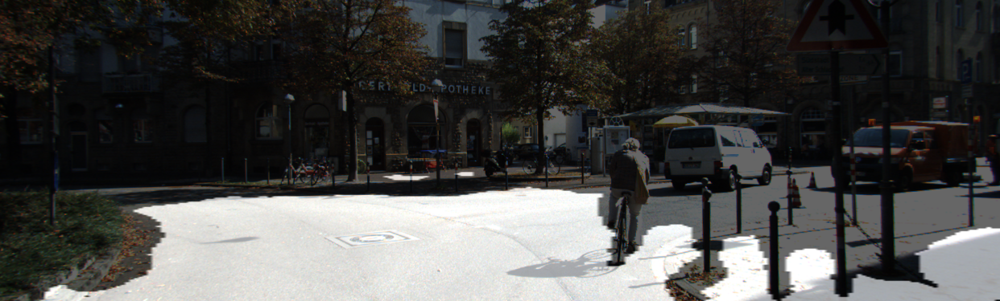

IoU: 0.6539
Dice:0.7908


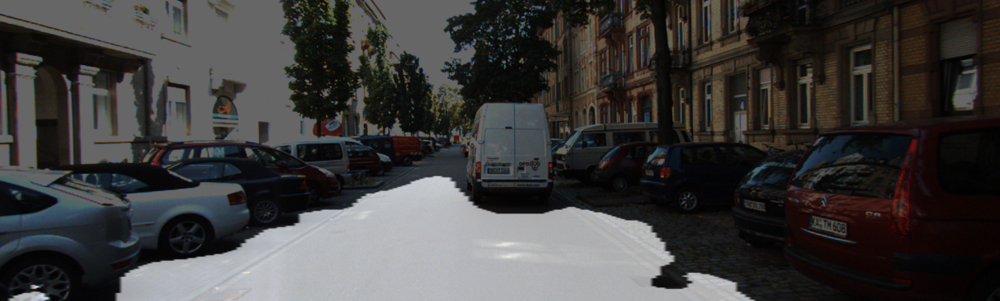

IoU: 0.7279
Dice:0.8425


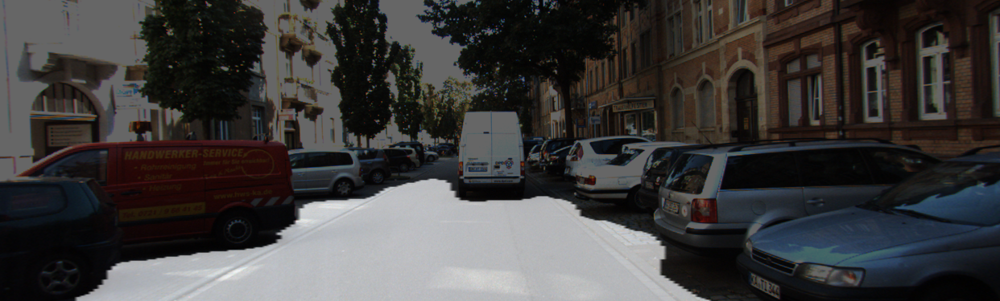

IoU: 0.7511
Dice:0.8578


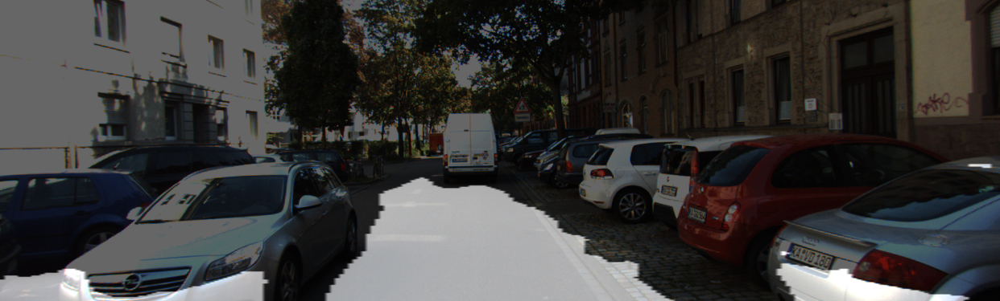

IoU: 0.5959
Dice:0.7468


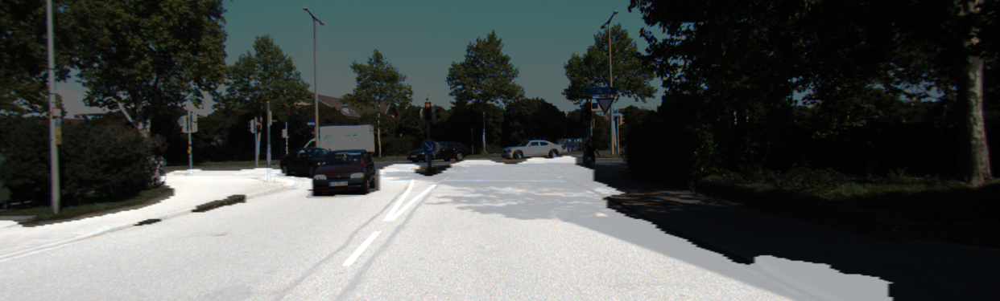

IoU: 0.8446
Dice:0.9157


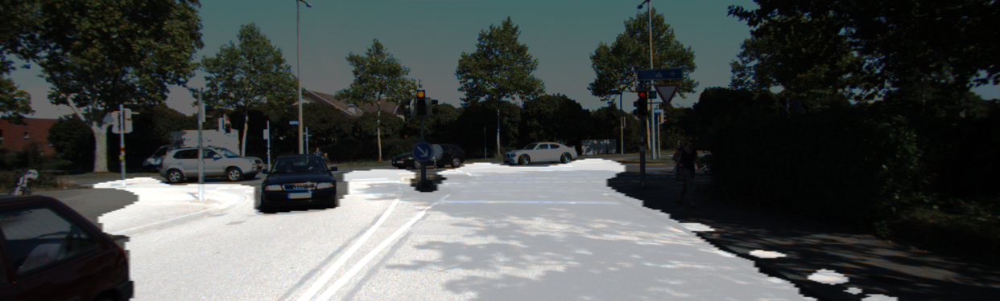

IoU: 0.8597
Dice:0.9246


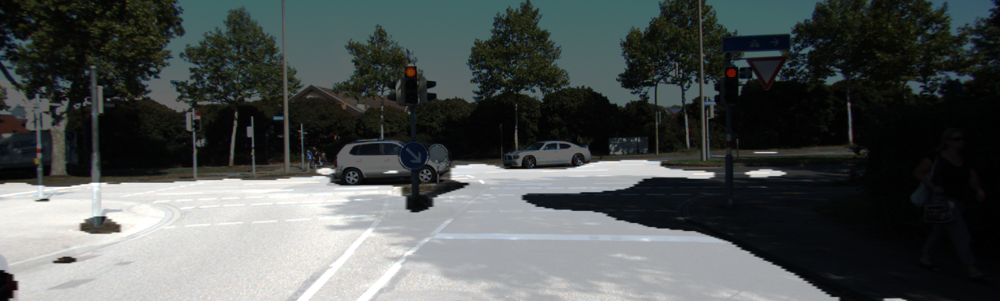

IoU: 0.7805
Dice:0.8767


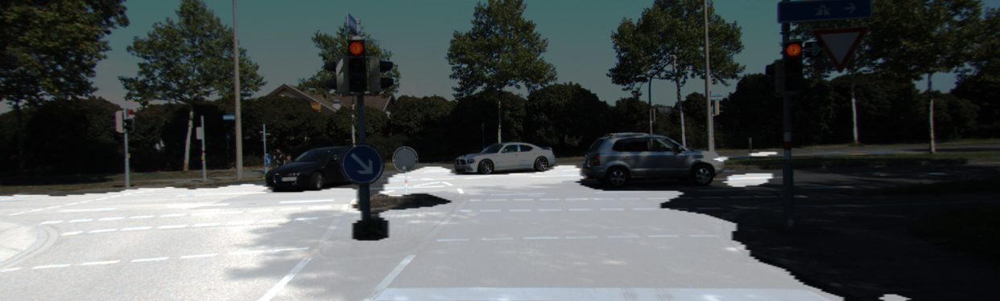

IoU: 0.8048
Dice:0.8918


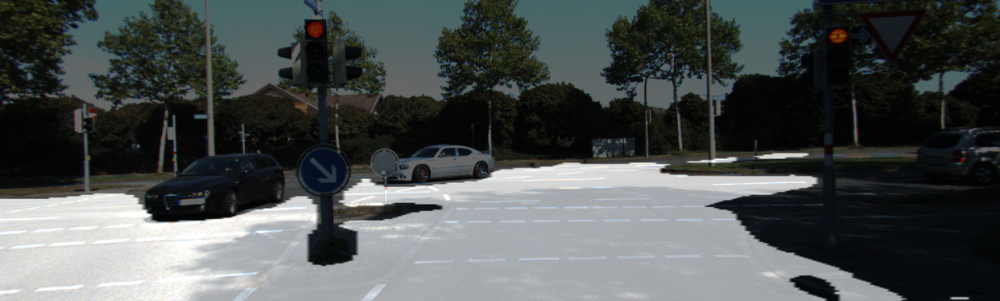

IoU: 0.8039
Dice:0.8913


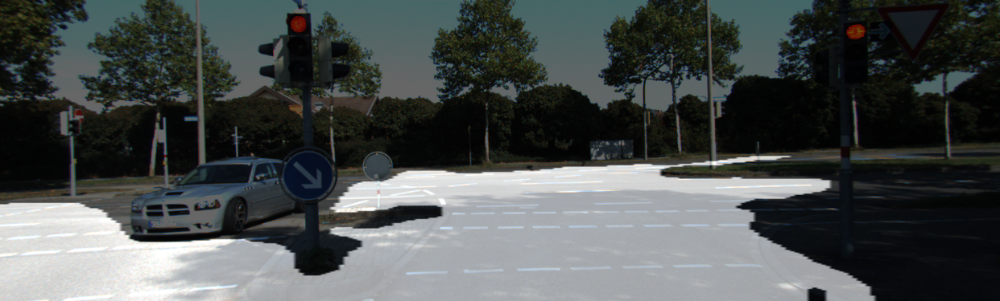

IoU: 0.7444
Dice:0.8535


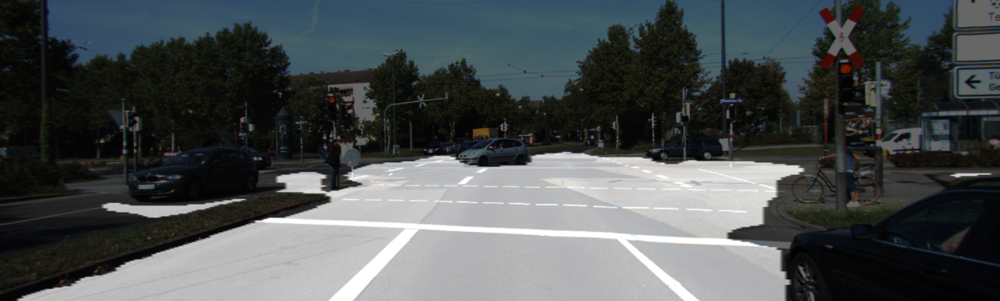

IoU: 0.8321
Dice:0.9083


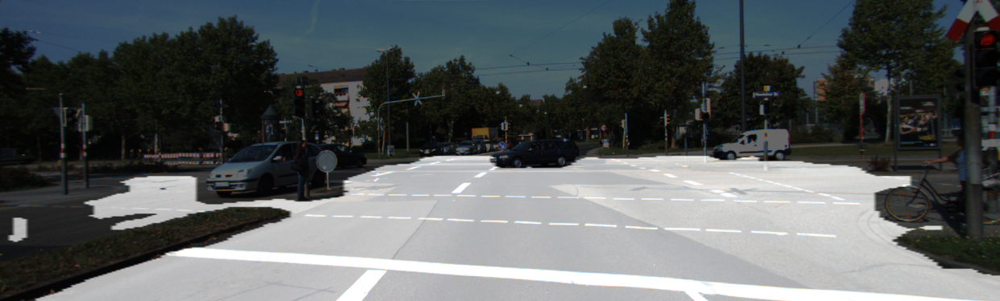

IoU: 0.8676
Dice:0.9291


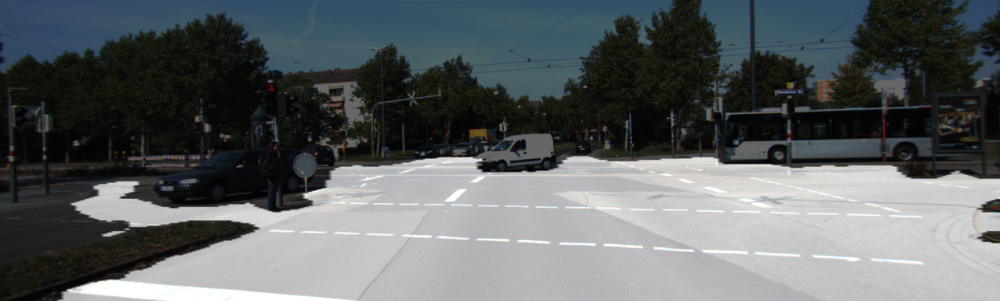

IoU: 0.8542
Dice:0.9213


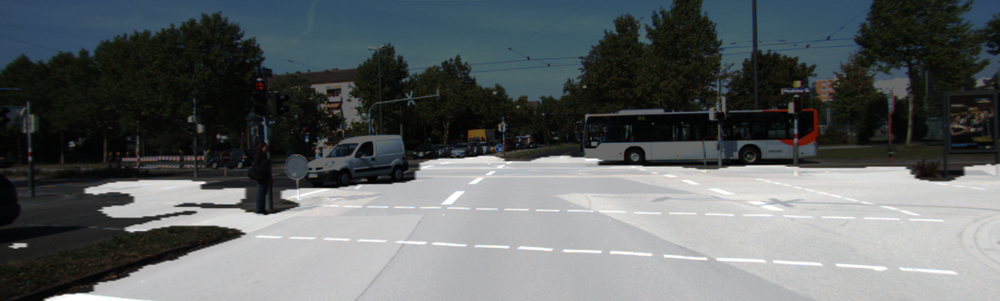

IoU: 0.8467
Dice:0.9170


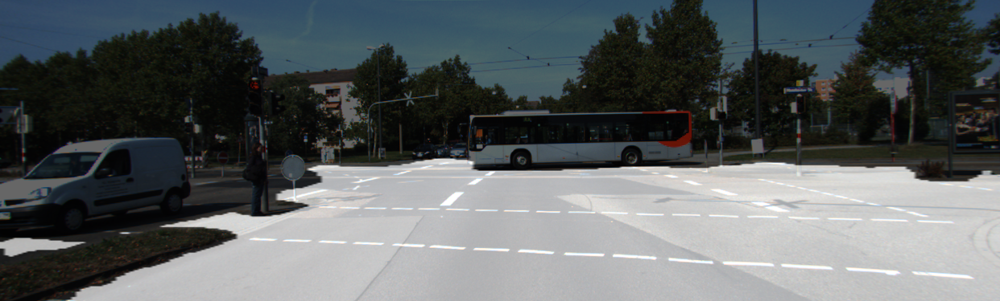

IoU: 0.8754
Dice:0.9336


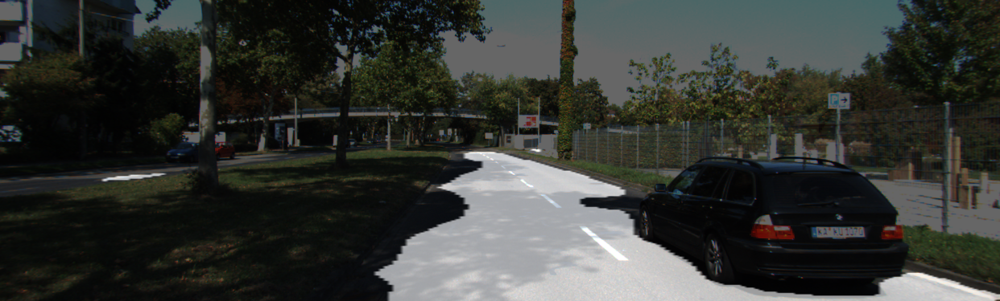

IoU: 0.7283
Dice:0.8428


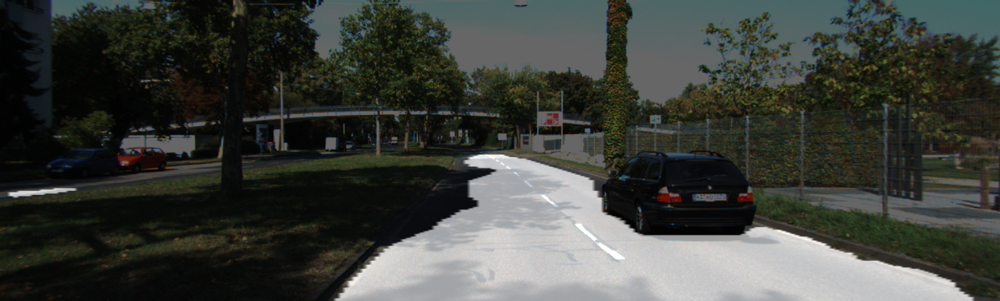

IoU: 0.8436
Dice:0.9152


In [217]:
for i in range(20):
    output, prediction, target = get_output(
         xnet_model , 
         test_preproc,
         image_path=dir_path + f'/image_2/00{str(i).zfill(4)}_10.png',
         output_path=dir_path + f'./result_{str(i).zfill(3)}.png',
         label_path=dir_path + f'/semantic/00{str(i).zfill(4)}_10.png'
     )
    iou_score = compute_iou(prediction, target)
    dice_score = compute_dice(prediction, target)
    print(f"IoU: {iou_score:.4f}\nDice:{dice_score:.4f}")

# 회고

- unet보다 xnet에서 더 좋은 성능이 나올것이라 생각했는데 큰 차이가 나지 않아서 신기했다. 조금 더 복잡한 문제로 바꾸면 또 다를 수 있을 것 같음.